In [1]:
from skimage.exposure import histogram as imhist
from skimage.exposure import equalize_hist
from skimage.filters import gaussian
from skimage.filters.rank import median
from pylab import *
import numpy as np
import matplotlib.pyplot as plt
from skimage import img_as_float
from skimage import exposure, io

In [2]:
def graficar_imagen(img_noise_reduced, name):
    #    # Extracción de canales
    R = img_noise_reduced[...,0]
    G = img_noise_reduced[...,1]
    B = img_noise_reduced[...,2]

    #Obtener histograma de canales
    hist, bin_centers = imhist(img_noise_reduced)
    hist_R, bin_centers_R = imhist(R)
    hist_G, bin_centers_G = imhist(G)
    hist_B, bin_centers_B = imhist(B)

    # Obtener lienzos para la imagen sin ruido y su histograma
    _, (ax_image_noise_reduced, ax_hist_noise_reduced) = subplots(1, 2, figsize=(12, 4))
    plt.suptitle(f"Comparativo de técnicas: Imagen {name}", y=1.02, fontsize=18)
    # Mostrar imagen en el primer lienzo
    ax_image_noise_reduced.imshow(img_noise_reduced, cmap="gray")
    ax_image_noise_reduced.set_title(name, fontsize=10)
    ax_hist_noise_reduced.set_title(f"Histograma {name}", fontsize=10)

    # Mostar histograma en el segundo lienzo
    ax_hist_noise_reduced.fill_between(bin_centers, hist, alpha=0.2, color="gray")
    ax_hist_noise_reduced.fill_between(bin_centers_R, hist_R, alpha=0.2, color="red")
    ax_hist_noise_reduced.fill_between(bin_centers_G, hist_G, alpha=0.2, color="green")
    ax_hist_noise_reduced.fill_between(bin_centers_B, hist_B, alpha=0.2, color="blue")

    ax_hist_noise_reduced.set_xlabel('intensidad')
    ax_hist_noise_reduced.set_ylabel('# pixeles')

In [3]:
def noise_reduction_gaussian(img, sigma=2.0):
    
    if img.ndim == 3:
        img_noise_reduced = gaussian(img, sigma=sigma, preserve_range=True, channel_axis=-1)
    else:
        img_noise_reduced = gaussian(img, sigma=sigma, preserve_range=True)

    graficar_imagen(img_noise_reduced, "Gaussian")
    return img_noise_reduced

from skimage.exposure import adjust_gamma
def noise_reduction_gamma(img, gamma=2.0):
    
    if img.ndim == 3:
        img_noise_reduced = adjust_gamma(img, gamma)
    else:
        img_noise_reduced = gaussian(img, gamma, preserve_range=True)

    graficar_imagen(img_noise_reduced, "Gamma")
    return img_noise_reduced
    
from skimage.filters import median
from skimage.morphology import disk
import numpy as np

def noise_reduction_median(img, footprint=None):
    """
    Suprime ruido con filtro de mediana.
    - img: array 2D (gris) o 3D (BGR color)
    - footprint: elemento estructurante de skimage.morphology (p.ej. disk(3))
    """
    # Si no se especifica footprint, usamos un disco de radio 3
    if footprint is None:
        footprint = disk(3)

    # Aplicar mediana canal a canal si es color
    if img.ndim == 3:
        denoised = median(img)
    else:
        denoised = median(img, footprint=footprint)

    # Convertir a uint8 0-255 si es float en [0,1]
    if denoised.dtype != np.uint8:
        if denoised.max() <= 1.0:
            denoised = (denoised * 255).astype(np.uint8)
        else:
            denoised = denoised.astype(np.uint8)

    # Mostrar resultado y su histograma
    graficar_imagen(denoised, "Median")
    return denoised


def imadjust(F,range_in=(0,1),range_out=(0,1),gamma=1):
    G = (((F - range_in[0]) / (range_in[1] - range_in[0])) ** gamma) * (range_out[1] - range_out[0]) + range_out[0]
    graficar_imagen(G)
    return G

In [4]:
# Usando la técnica ecualizacion histograma

def equalizacion_histograma_rgb(imagen):

    # Extracción de canales
    R = imagen[...,0]
    G = imagen[...,1]
    B = imagen[...,2]

    #Obtener histograma de canales
    hist_R, bin_centers_R = imhist(R)
    hist_G, bin_centers_G = imhist(G)
    hist_B, bin_centers_B = imhist(B)

    # Ecualizar cada canal
    R_eq = equalize_hist(R)
    G_eq = equalize_hist(G)
    B_eq = equalize_hist(B)

    # Recombinar la imagen ecualizada
    imagen_eq = np.stack((R_eq,G_eq,B_eq),axis=2)

    # Cancelar de ruido
    #img_clean = noise_reduction_average(imagen_eq,7)
    #

    #Obtener histograma de canales de imagene equalizada
    hist_R_eq, bin_centers_R_eq = imhist(R_eq)
    hist_G_eq, bin_centers_G_eq = imhist(G_eq)
    hist_B_eq, bin_centers_B_eq = imhist(B_eq)

    # Obtener lienzos para la imagen y para el histograma
    _, (ax_image, ax_hist) = subplots(1, 2, figsize=(12, 4))

    # Obtener lienzos para la imagen equalizada y para el histograma
    _, (ax_image_eq, ax_hist_eq) = subplots(1, 2, figsize=(12, 4))

    # Mostrar imagen en el primer lienzo
    ax_image.imshow(imagen, cmap="gray")

    # Mostar histograma en el segundo lienzo
    ax_hist.fill_between(bin_centers_R, hist_R, alpha=0.2, color="red")
    ax_hist.fill_between(bin_centers_G, hist_G, alpha=0.2, color="green")
    ax_hist.fill_between(bin_centers_B, hist_B, alpha=0.2, color="blue")

    ax_hist.set_xlabel('intensidad')
    ax_hist.set_ylabel('# pixeles')

    # Mostrar imagen equalizada
    ax_image_eq.imshow(imagen_eq)

    # Mostar histograma de imagen equalizada en el segundo lienzo
    ax_hist_eq.fill_between(bin_centers_R_eq,hist_R_eq,alpha=0.2,color="red")
    ax_hist_eq.fill_between(bin_centers_G_eq,hist_G_eq,alpha=0.2,color="green")
    ax_hist_eq.fill_between(bin_centers_B_eq,hist_B_eq,alpha=0.2,color="blue")

    ax_hist_eq.set_xlabel('intensidad')
    ax_hist_eq.set_ylabel('# pixeles')

    return imagen_eq

# Mostrar imagen


In [5]:
def equalizacion_histograma(imagen):


    # Recombinar la imagen ecualizada
    imagen_eq = equalize_hist(imagen)
    # Cancelar de ruido
    #img_clean = noise_reduction_average(imagen_eq,7)
    #

    graficar_imagen(imagen_eq, "Equalized Histogram")

    return imagen_eq


In [6]:
# Usando la técnica de corrección gamma o ley de potencia

def correccion_gamma(path_image, gamma_value =0.3):
    # Cargando la imagen y convertiendo a flotante
    image_o = imread(path_image)
    image_read = img_as_float(image_o)

    # Aplicando correccion gamma
    gamma = gamma_value
    img_gamma = exposure.adjust_gamma(image_read,gamma)

    # Creando curvas de transformacion
    r = np.linspace(0,1,256)
    s_original = r  # gamma = 1
    s_gamma = np.power(r,gamma)

    # Crear figura con 2 lienzos: original y corregida
    _, (ax_image_o, ax_plot_o) = subplots(1, 2, figsize=(12, 4))
    _, (ax_image_g, ax_plot_g) = subplots(1, 2, figsize=(12, 4))

    # --------- Imagen original ---------
    ax_image_o.imshow(image_o)
    ax_image_o.set_title('Imagen Original')

    ax_plot_o.plot(r, s_original, label='Gamma = 1', color='green')
    ax_plot_o.set_title('Curva de Intensidad Original')
    ax_plot_o.set_xlabel('Intensidad de entrada (r)')
    ax_plot_o.set_ylabel('Intensidad de salida (s)')
    ax_plot_o.grid(True)
    ax_plot_o.legend()

    # --------- Imagen con correccion gamma ---------
    ax_image_g.imshow(img_gamma)
    ax_image_g.set_title(f'Imagen Corregida (Gamma = {gamma})')

    ax_plot_g.plot(r, s_gamma, label=f'Gamma = {gamma}', color='green')
    ax_plot_g.set_title('Curva de Corrección Gamma')
    ax_plot_g.set_xlabel('Intensidad de entrada (r)')
    ax_plot_g.set_ylabel('Intensidad de salida (s)')
    ax_plot_g.grid(True)
    ax_plot_g.legend()

    return img_gamma


In [7]:
# Aplicando la técnica de transformacion logaritmica
def transformacion_logaritmica(path_image,gain_value=1):
    # Cargando la imagen y convertiendo a flotante
    image_o = imread(path_image)
    image_read = img_as_float(image_o)

    # Aplicando correccion gamma
    gain = gain_value
    img_log = exposure.adjust_log(image_read,gain)

    # Creando curvas de transformacion
    r = np.linspace(0,1,256)
    s_original = r  # log = 1
    s_log = gain * np.log1p(r)

    # Crear figura con 2 lienzos: original y corregida
    _, (ax_image_o, ax_plot_o) = subplots(1, 2, figsize=(12, 4))
    _, (ax_image_g, ax_plot_g) = subplots(1, 2, figsize=(12, 4))

    # --------- Imagen original ---------
    ax_image_o.imshow(image_o)
    ax_image_o.set_title('Imagen Original')

    ax_plot_o.plot(r, s_original, color='green')
    ax_plot_o.set_title('Curva de Intensidad Original')
    ax_plot_o.set_xlabel('Intensidad de entrada (r)')
    ax_plot_o.set_ylabel('Intensidad de salida (s)')
    ax_plot_o.grid(True)

    # --------- Imagen con correccion gamma ---------
    ax_image_g.imshow(img_log)
    ax_image_g.set_title(f'Imagen Corregida (Gain = {gain})')

    ax_plot_g.plot(r, s_log, label=f'Gain = {gain}', color='green')
    ax_plot_g.set_title('Curva de Transformacion Logaritmica')
    ax_plot_g.set_xlabel('Intensidad de entrada (r)')
    ax_plot_g.set_ylabel('Intensidad de salida (s)')
    ax_plot_g.grid(True)
    ax_plot_g.legend()

    graficar_imagen(img_log, "Logarithmic Transformation")
    return img_log

In [8]:
from skimage.exposure import rescale_intensity
def sk_rescale_intensity(img: np.ndarray,
                         in_range='image',
                         out_range=(0, 255)) -> np.ndarray:

    ri = rescale_intensity(img, in_range=in_range, out_range=out_range)
    ri_unit8 = ri.astype(np.uint8)
    graficar_imagen(ri_unit8, "Rescale Intensity")
    return ri_unit8

In [9]:
from skimage.exposure import equalize_adapthist
import cv2
def apply_clahe_skimage(img, clip_limit=0.01, kernel_size=(8,8)):
    """
    Aplica CLAHE usando skimage.exposure.equalize_adapthist.
    - img: array 2D (gris) o 3D (RGB o BGR)
    - clip_limit: límite de contraste
    - kernel_size: tamaño de región
    """
    # Convertir a escala de grises si es color
    if img.ndim == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img_gray = img
    # Normalizar a [0,1] float
    img_norm = img_gray.astype(np.float32) / 255.0
    # Aplicar CLAHE
    img_clahe = equalize_adapthist(img_norm, clip_limit=clip_limit, kernel_size=kernel_size)
    # Reescalar a [0,255]
    img_clahe_unit8 = (img_clahe * 255).astype(np.uint8)
    graficar_imagen(img_clahe_unit8, "CLAHE")
    return img_clahe_unit8


In [25]:
import cv2
import numpy as np
def apply_aritmetic_operations(img, scalar=30):
    """
    Aplica operaciones aritméticas (suma y resta) a la imagen.
    - img: array 2D (gris) o 3D (RGB o BGR)
    - kernel_size: tamaño del kernel para operaciones
    """
    # Convertir a escala de grises si es color
    if img.ndim == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img_gray = img

    # Aplicar operaciones aritméticas
    suma = cv2.add(img_gray,img_gray)
    suma2 = cv2.add(img_gray,suma)
    suma3 = cv2.add(img_gray,suma2)
    suma4 = cv2.add(img_gray,suma3)
    suma5 = cv2.add(img_gray,suma4)
    suma10= cv2.add(suma5,suma5)
    suma20= cv2.add(suma10,suma10)
    img_sum= cv2.add(suma20,suma20)

    multiplied_image = np.clip(img * scalar, 0, 255).astype('uint8')

    # Mostrar resultados
    graficar_imagen(img_sum, "Suma")
    graficar_imagen(multiplied_image, "multiplied_image")

    return img_sum, multiplied_image

E


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.0].


(array([[2.3171766 , 2.010353  , 1.627859  , ..., 0.24451767, 0.29872945,
         0.11049413],
        [1.9192472 , 1.9755294 , 1.8221177 , ..., 0.1882353 , 0.1882353 ,
         0.1882353 ],
        [3.5550122 , 3.5201883 , 3.6521416 , ..., 0.1882353 , 0.1882353 ,
         0.1882353 ],
        ...,
        [3.0117648 , 3.122259  , 3.0659766 , ..., 1.6828237 , 1.9273412 ,
         2.2260706 ],
        [3.0117648 , 2.8777413 , 3.4424472 , ..., 1.871059  , 1.5508705 ,
         1.9273412 ],
        [2.9903064 , 3.0659766 , 3.254212  , ..., 1.7042825 , 1.6828237 ,
         1.9273412 ]], shape=(720, 1080), dtype=float32),
 array([[[4, 4, 5],
         [3, 3, 5],
         [1, 2, 6],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[3, 3, 5],
         [3, 3, 5],
         [2, 3, 5],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[7, 7, 7],
         [7, 7, 7],
         [7, 7, 7],
         ...,
         [0, 0, 0],
       

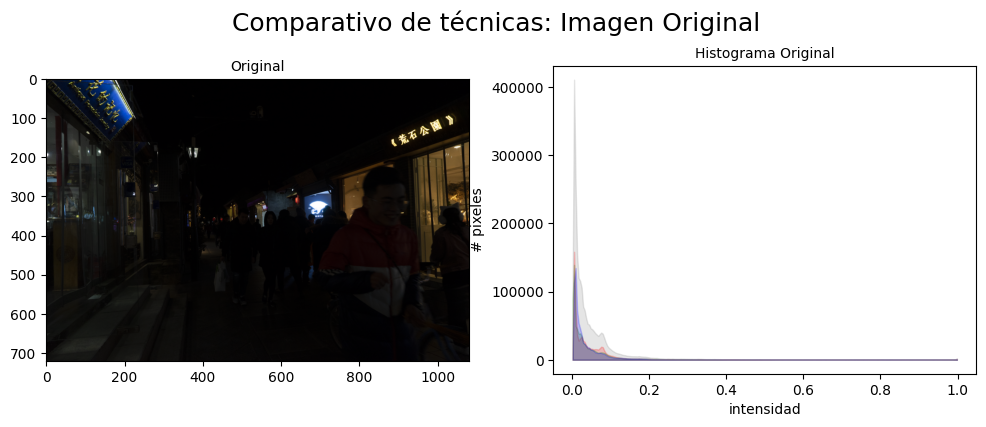

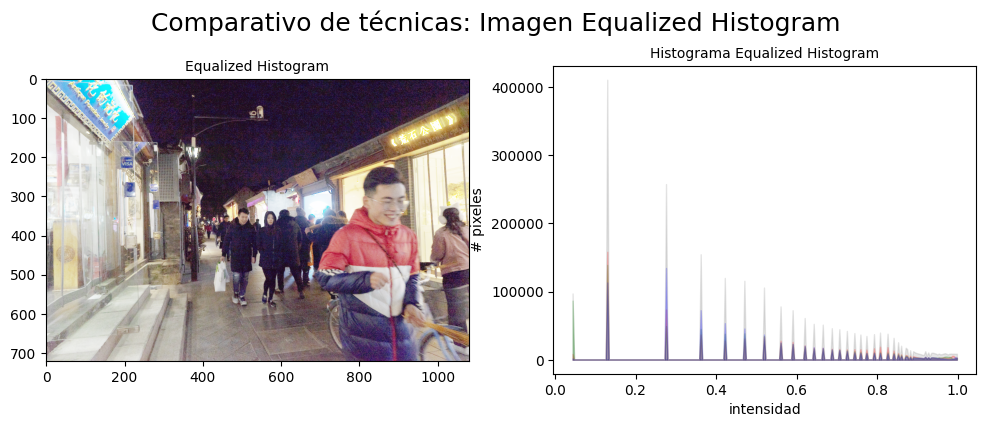

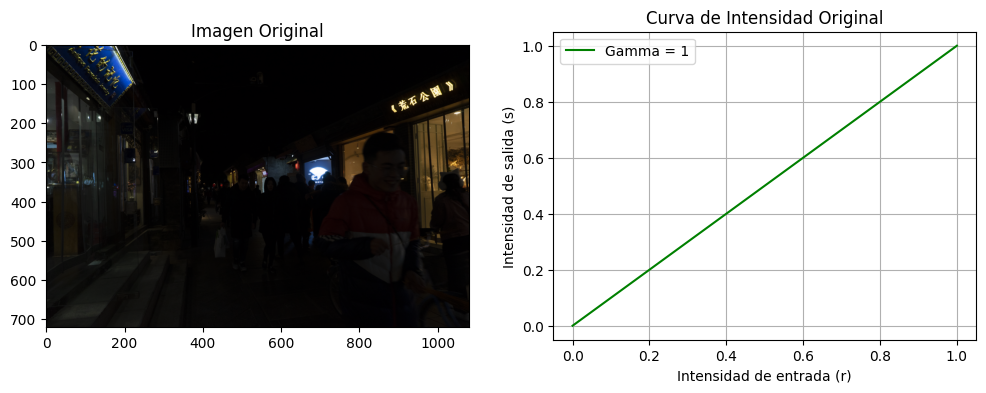

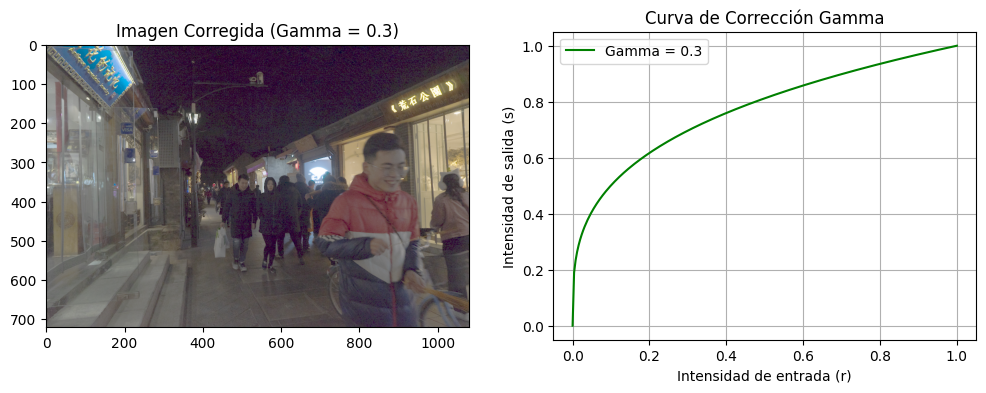

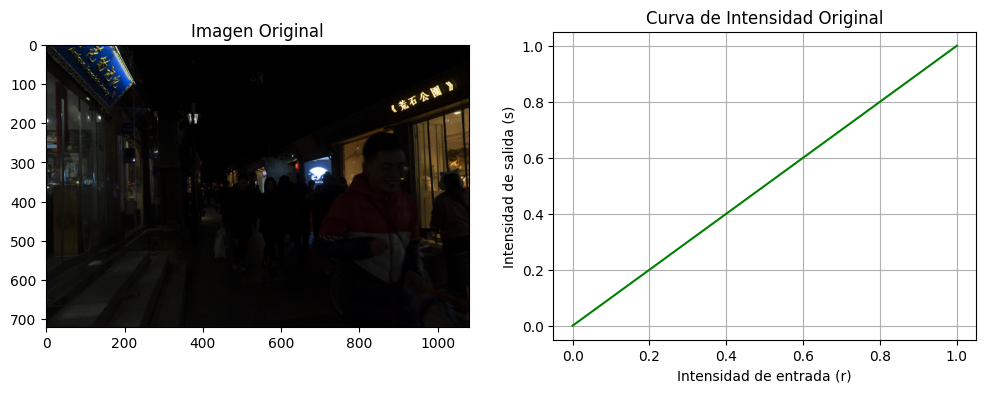

...

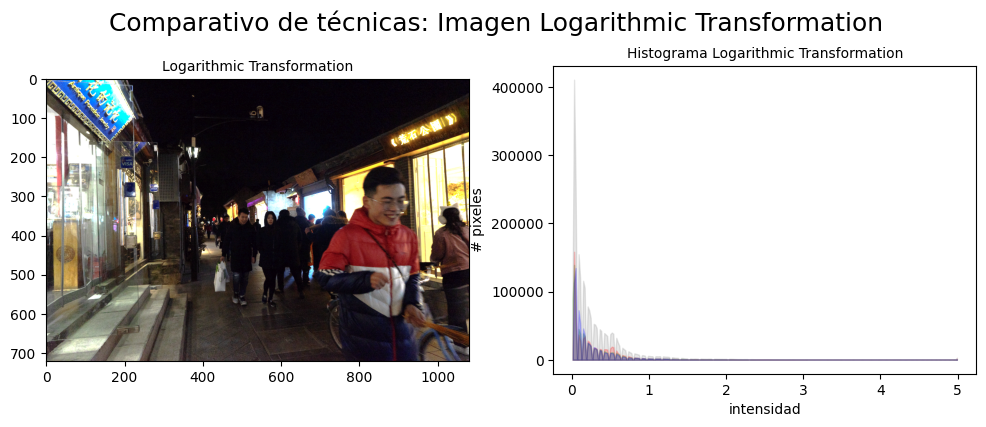

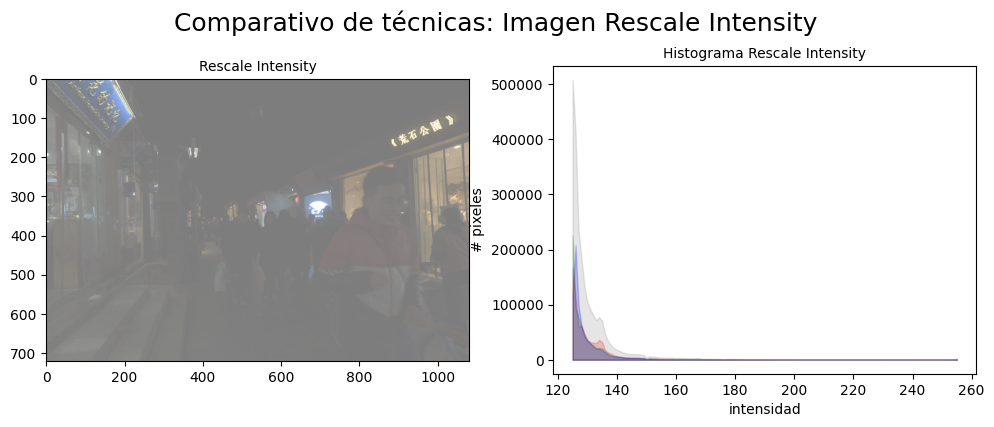

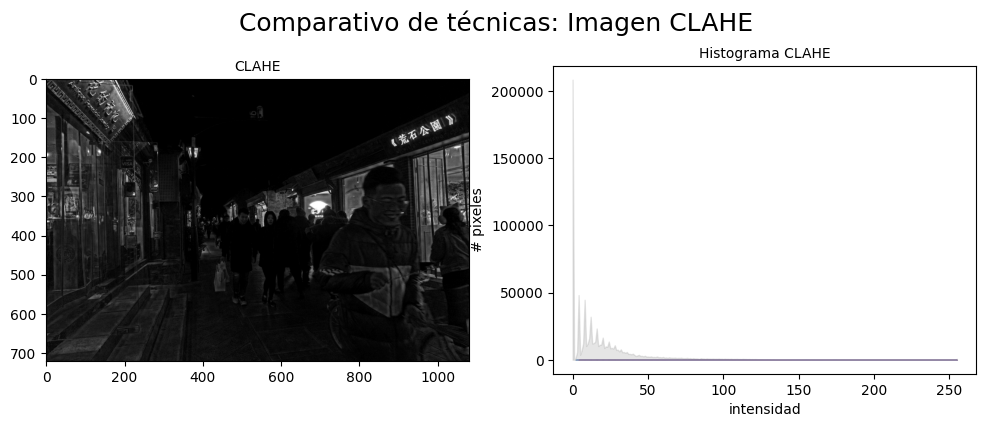

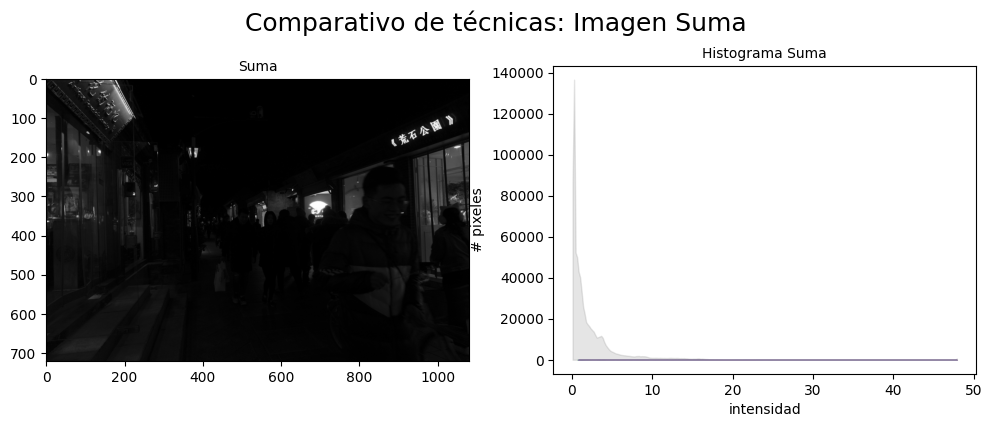

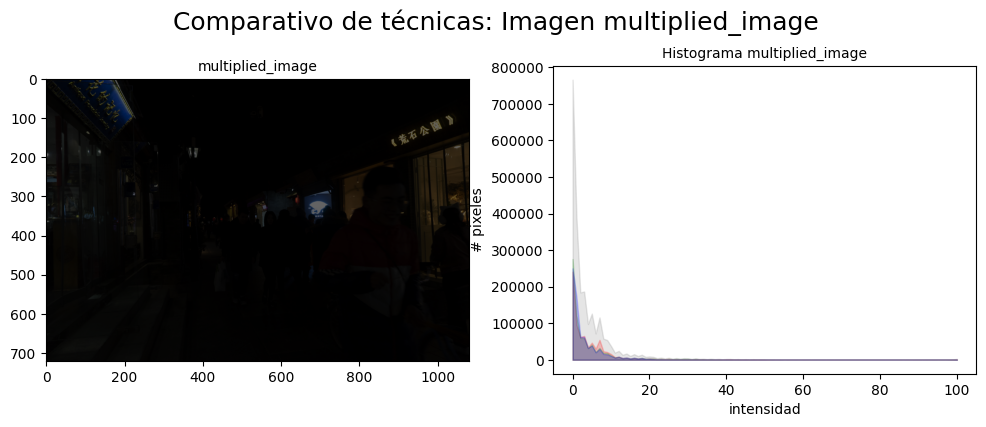

In [31]:
ruta_img = "Imagenes/1.png"
imagen = imread("Imagenes/1.png")
graficar_imagen(imagen, "Original")
print("E")
equalizacion_histograma(imagen)
correccion_gamma("imagenes/1.png")
transformacion_logaritmica(ruta_img,5)
sk_rescale_intensity(imagen, in_range='image', out_range=(125, 255))
apply_clahe_skimage(imagen, clip_limit=0.01, kernel_size=(8,8))
apply_aritmetic_operations(imagen, scalar=100)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..7.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..7.0].


(array([[ 0.07774118,  0.0992    ,  0.07774118, ..., 33.816097  ,
         33.905132  , 34.05045   ],
        [ 0.07774118,  0.20969412,  0.0992    , ..., 33.948048  ,
         33.794636  , 33.69544   ],
        [ 0.07774118,  0.07774118,  0.0992    , ..., 33.418167  ,
         33.36188   , 33.52866   ],
        ...,
        [ 0.41938823,  0.6290824 ,  0.6853648 , ...,  1.8014117 ,
          2.2556236 ,  1.7123766 ],
        [ 0.6076236 ,  0.6076236 ,  0.663906  , ...,  1.6346353 ,
          1.8791529 ,  2.1451294 ],
        [ 0.85214126,  0.4756706 ,  0.85214126, ...,  2.011106  ,
          1.4464    ,  1.9006119 ]], shape=(720, 1080), dtype=float32),
 array([[[ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         ...,
         [47, 48, 51],
         [47, 48, 51],
         [47, 49, 51]],
 
        [[ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         ...,
         [48, 48, 51],
         [47, 48, 51],
         [46, 48, 51]],
 
        [[ 0,  0,  0],
      

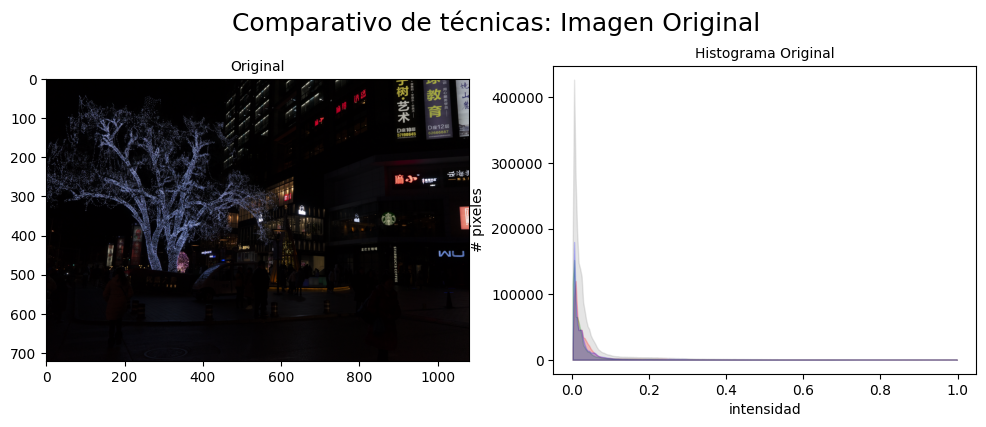

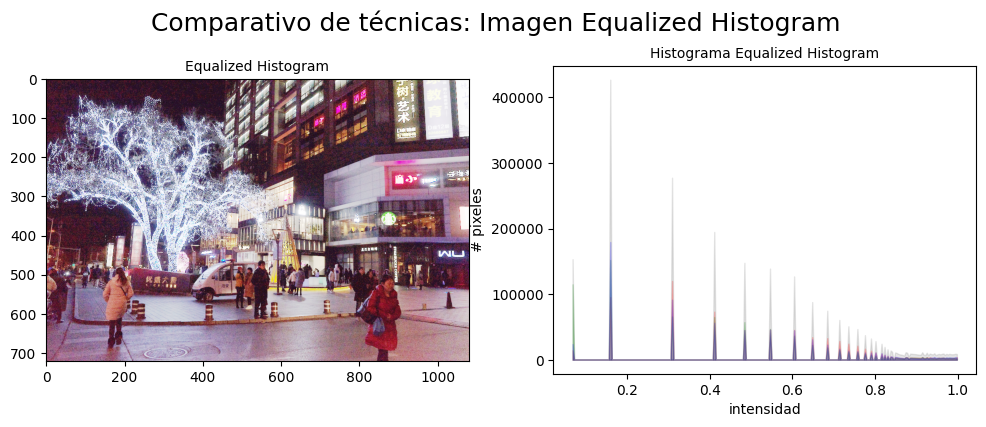

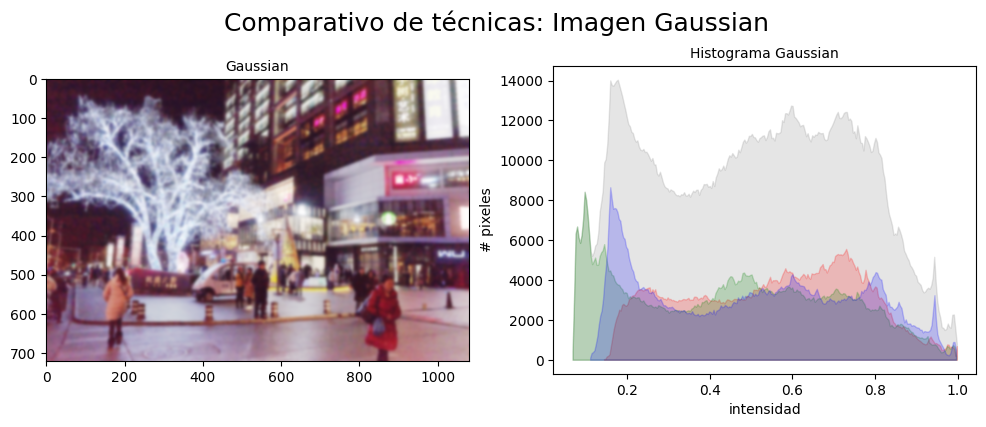

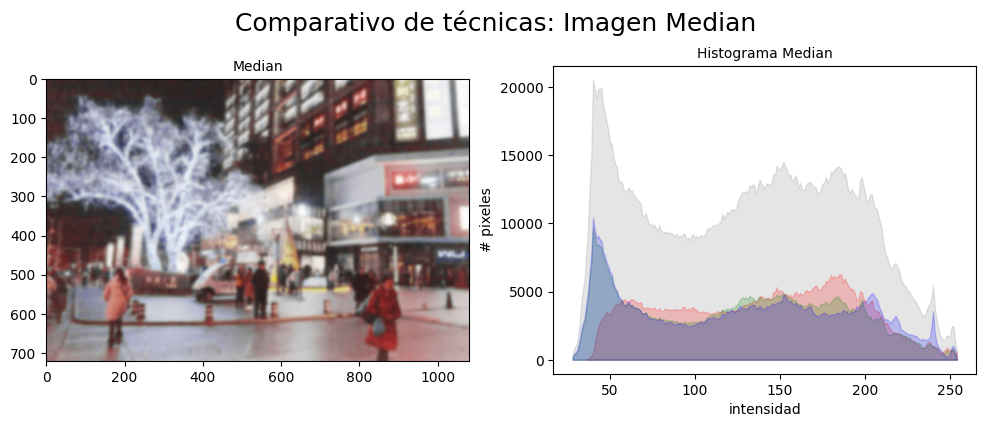

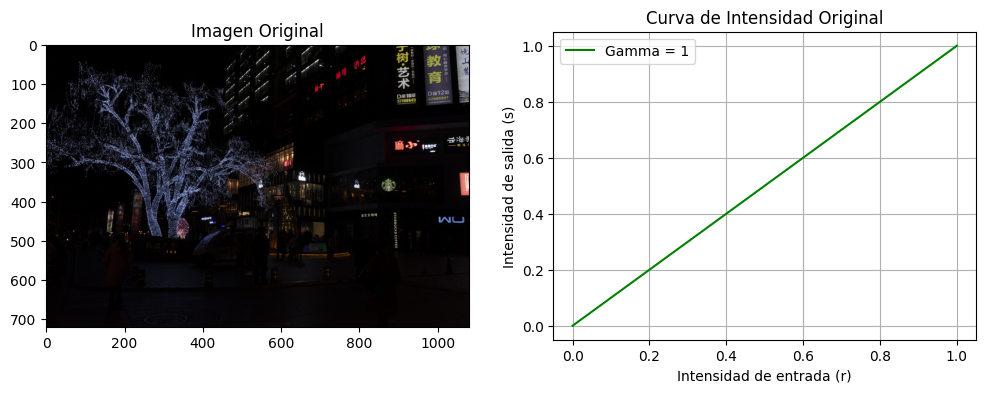

...

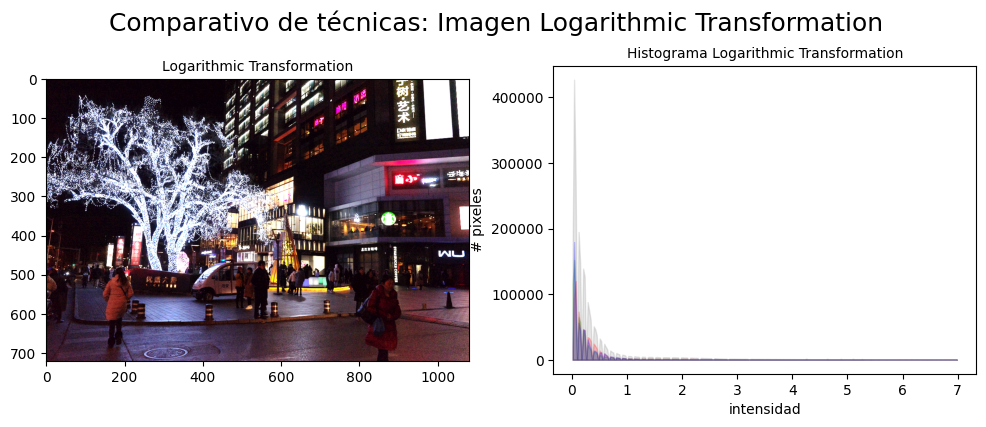

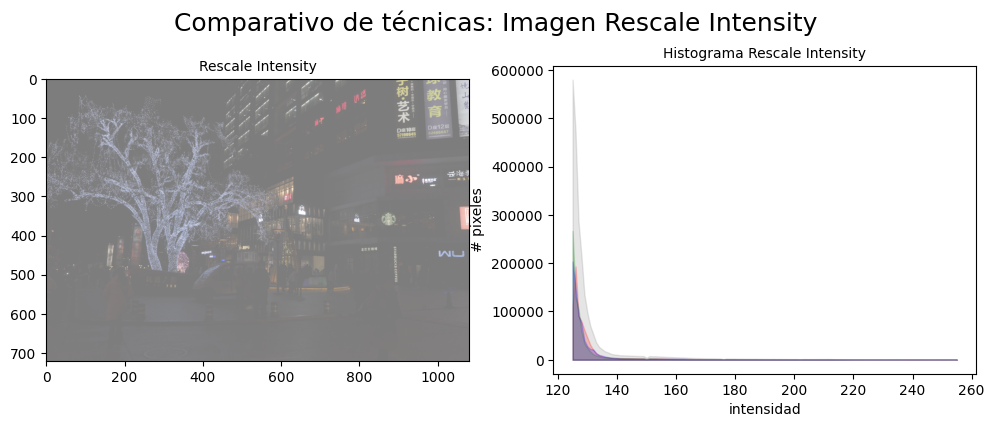

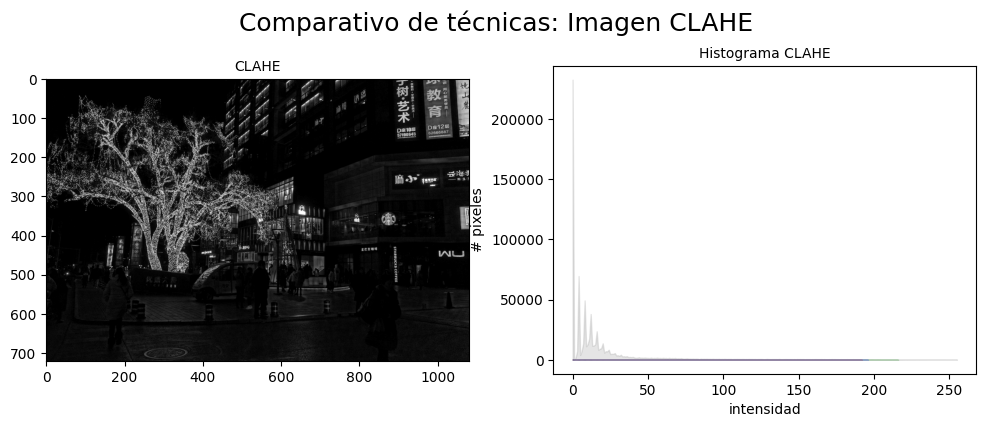

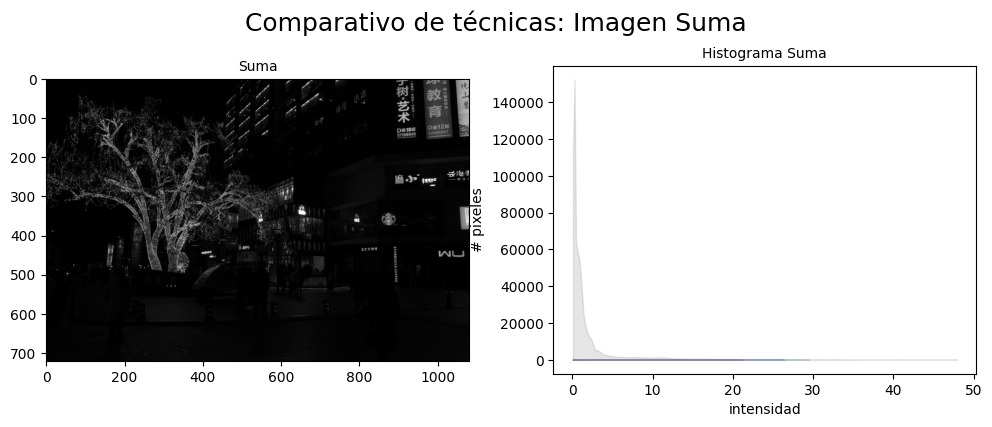

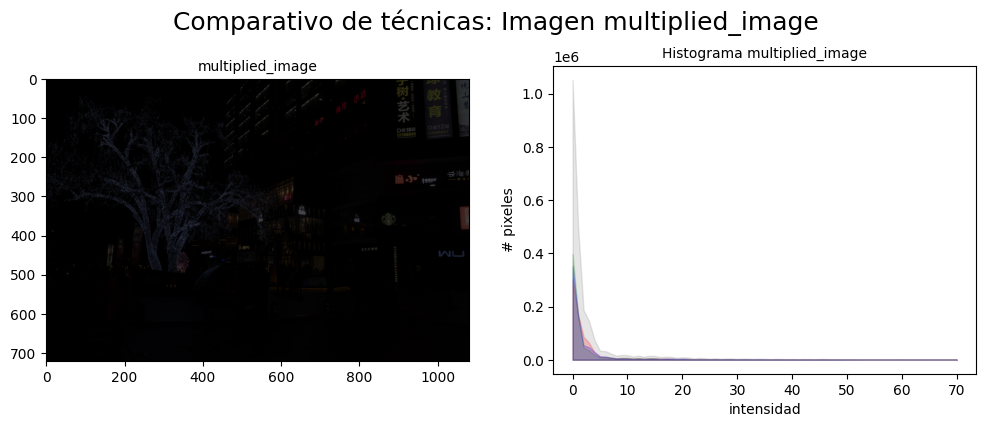

In [34]:
# Segunda imagen
ruta_img = "Imagenes/1002.png"
imagen = imread(ruta_img)
#Equalizacion de histograma
graficar_imagen(imagen, "Original")
eq = equalizacion_histograma(imagen)
gau = noise_reduction_gaussian(eq,sigma=3.5)
noise_reduction_median(gau) 
#Gamma
correccion_gamma(ruta_img)
#Transformacion logaritmica
transformacion_logaritmica(ruta_img,7)
#Rescale intensity
sk_rescale_intensity(imagen, in_range='image', out_range=(125, 255))
#CLAHE
apply_clahe_skimage(imagen, clip_limit=0.01, kernel_size=(8,8))
#Aritmetic operations
apply_aritmetic_operations(imagen, scalar=70)

Equalizacion de histograma


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..20.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..20.0].


(array([[0.34578824, 0.21176471, 0.15548237, ..., 0.5647059 , 0.54324704,
         0.3550118 ],
        [0.43482357, 0.4       , 0.13402353, ..., 0.5647059 , 0.54324704,
         0.41129416],
        [0.3785412 , 0.13402353, 0.13402353, ..., 0.43275297, 0.41129416,
         0.22305883],
        ...,
        [0.663906  , 0.5104942 , 0.4756706 , ..., 0.13402353, 0.13402353,
         0.13402353],
        [0.5319529 , 0.5319529 , 0.34371763, ..., 0.3785412 , 0.13402353,
         0.24451767],
        [0.32225883, 0.4756706 , 0.28743532, ..., 0.43482357, 0.43482357,
         0.26597646]], shape=(720, 1080), dtype=float32),
 array([[[0, 0, 1],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 1],
         [0, 0, 1],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 1],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
       

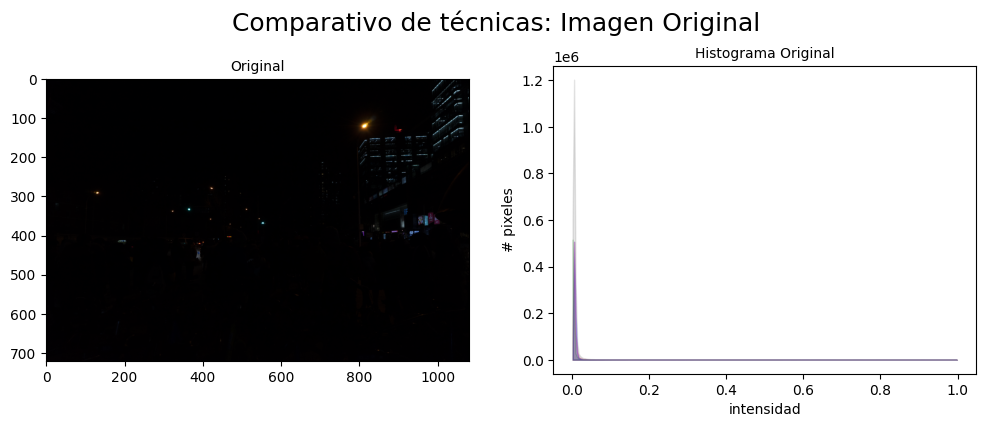

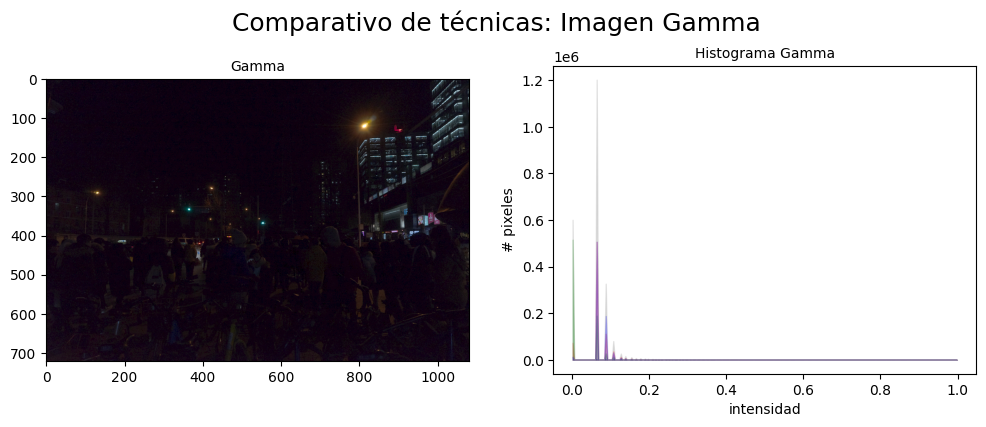

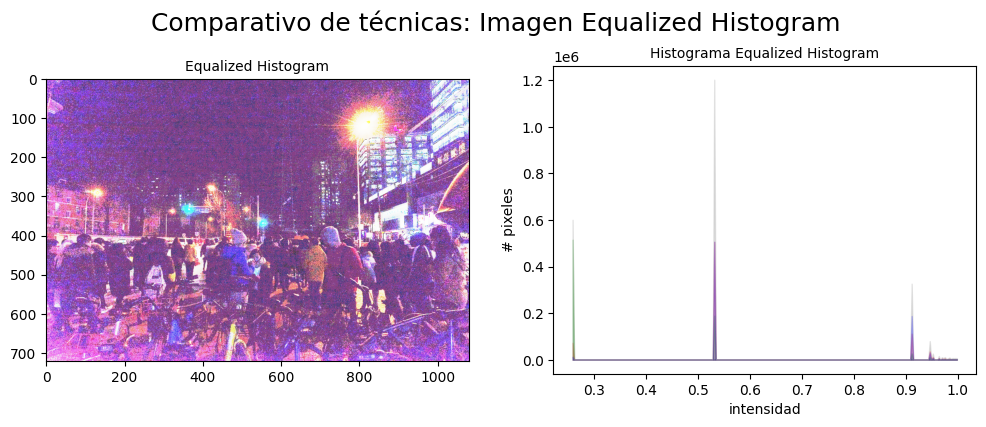

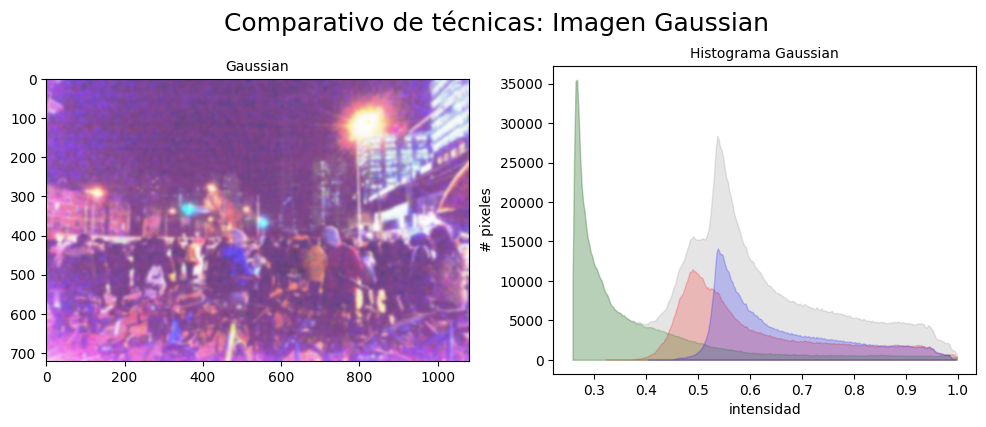

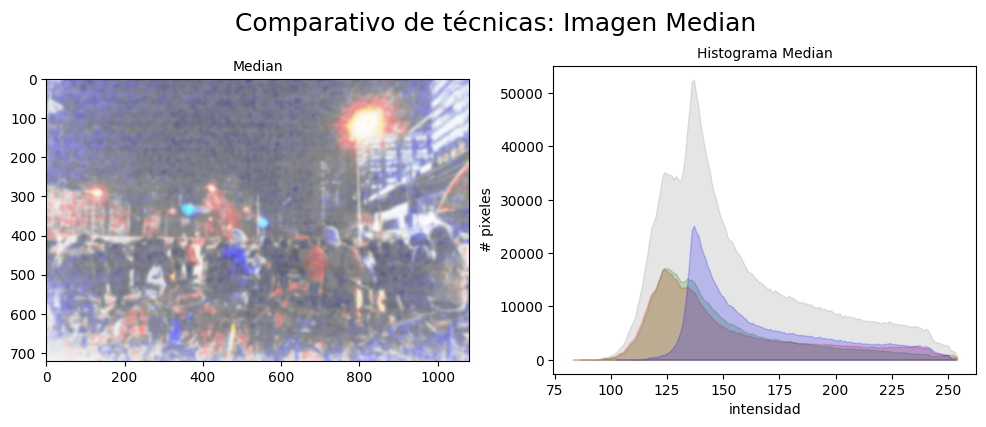

...

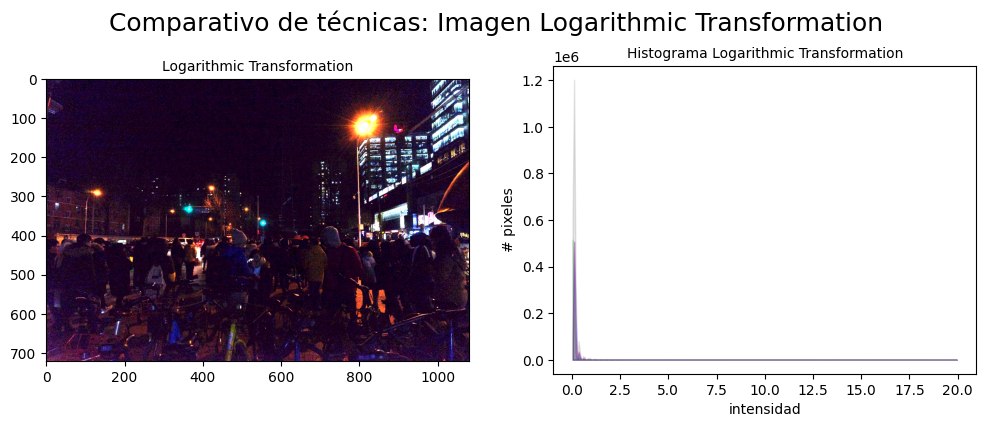

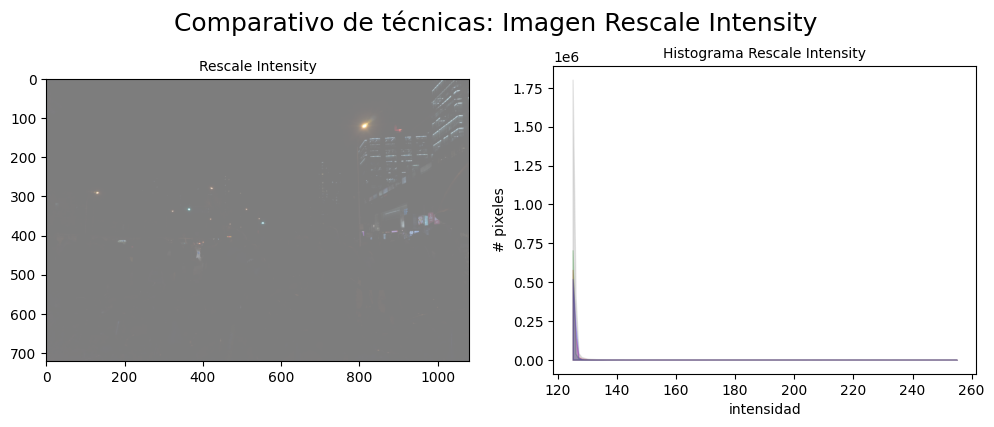

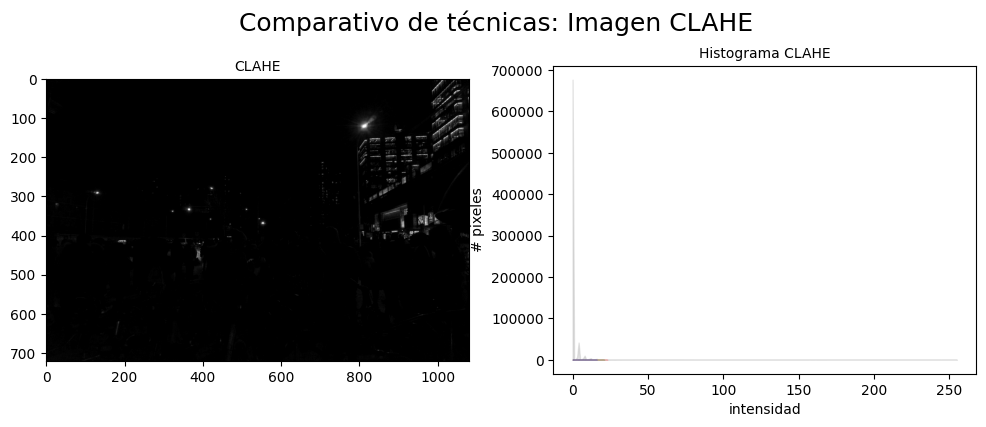

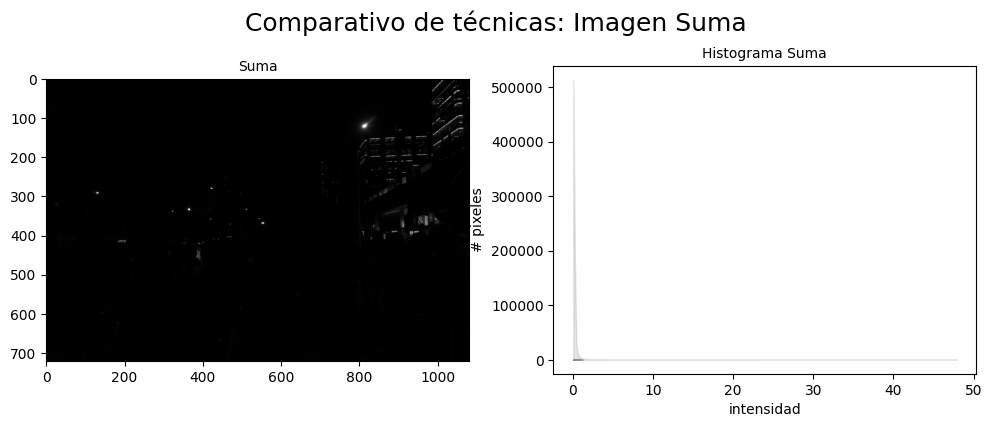

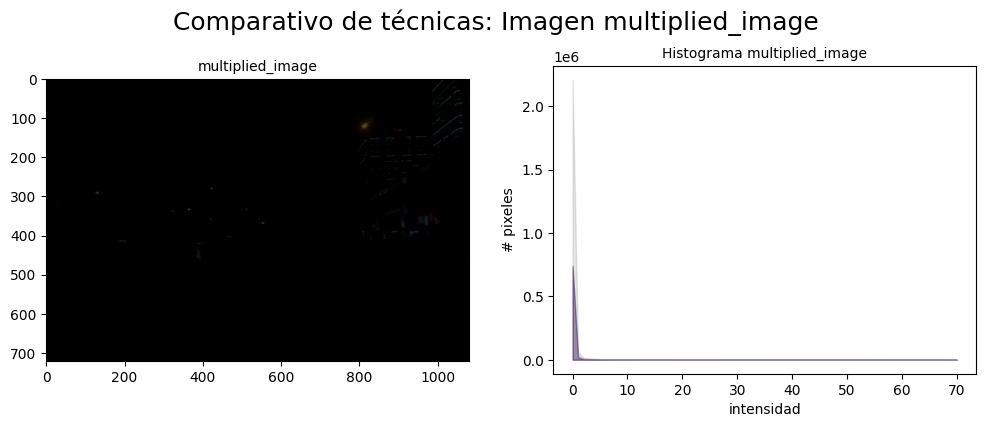

In [33]:
# Tercera imagen
ruta_img = "Imagenes/1003.png"
imagen = imread(ruta_img)
graficar_imagen(imagen, "Original")
#Equalizacion de histograma
print("Equalizacion de histograma")
g = noise_reduction_gamma(imagen,gamma=0.5)
eq = equalizacion_histograma(g)
gau = noise_reduction_gaussian(eq,sigma=3.5)
noise_reduction_median(gau) 
#Gamma
cg = correccion_gamma(ruta_img,gamma_value=0.27)
cg_gau = noise_reduction_gaussian(cg,sigma=0.7)
#Transformacion logaritmica
transformacion_logaritmica(ruta_img,20)
#Rescale intensity
sk_rescale_intensity(imagen, in_range='image', out_range=(125, 255))
#CLAHE
apply_clahe_skimage(imagen, clip_limit=0.01, kernel_size=(8,8))
#Aritmetic operations
apply_aritmetic_operations(imagen, scalar=70)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..9.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..9.0].


(array([[1.6431061 , 2.8481884 , 2.3049414 , ..., 0.02145883, 0.02145883,
         0.07774118],
        [1.3637648 , 2.0276706 , 1.7831532 , ..., 0.02145883, 0.02145883,
         0.07774118],
        [0.7856941 , 1.239906  , 1.1294118 , ..., 0.07774118, 0.20969412,
         0.20969412],
        ...,
        [0.4623059 , 0.6505412 , 0.6505412 , ..., 0.0992    , 0.20969412,
         0.20969412],
        [0.59425884, 0.83877647, 0.6505412 , ..., 0.12065882, 0.0992    ,
         0.20969412],
        [0.80395305, 0.9165177 , 0.7282824 , ..., 0.33035296, 0.33035296,
         0.20969412]], shape=(720, 1080), dtype=float32),
 array([[[1, 3, 3],
         [4, 6, 5],
         [3, 5, 4],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[1, 3, 2],
         [3, 4, 4],
         [3, 3, 3],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[1, 1, 1],
         [2, 2, 2],
         [2, 2, 2],
         ...,
         [0, 0, 0],
       

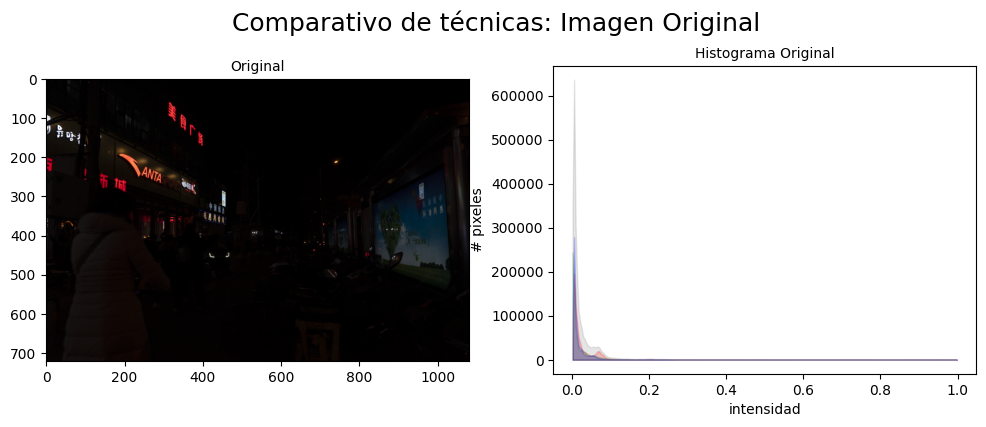

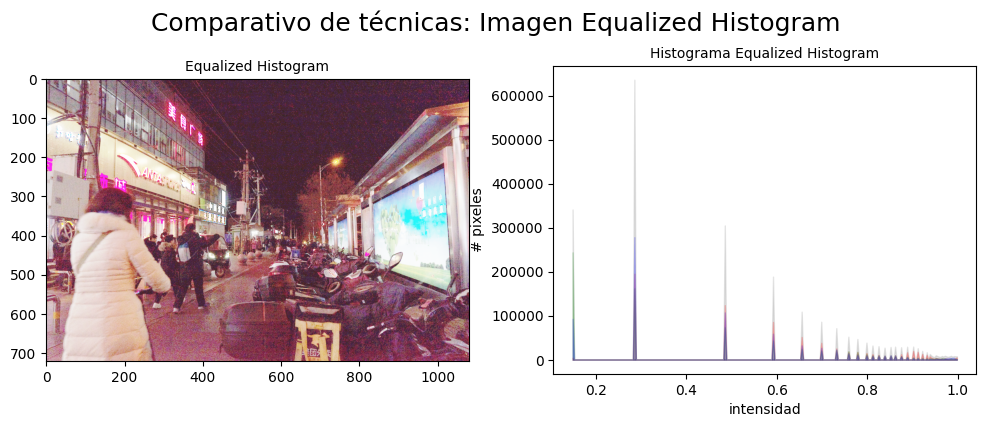

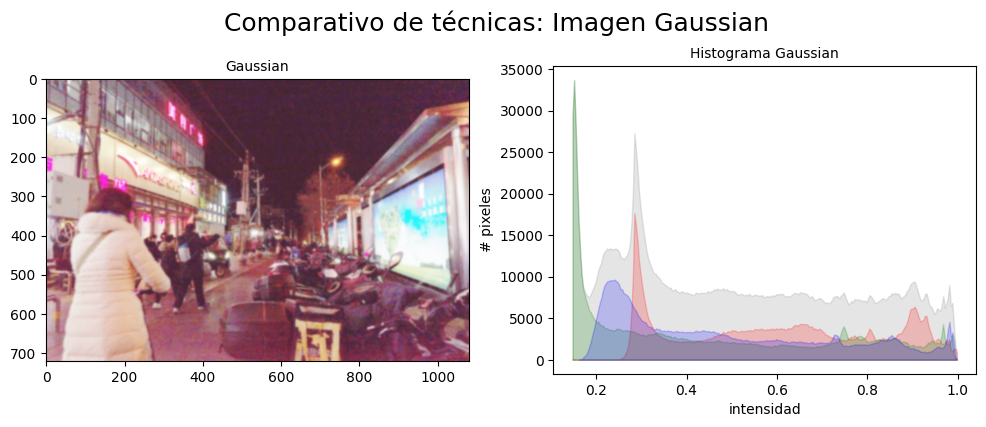

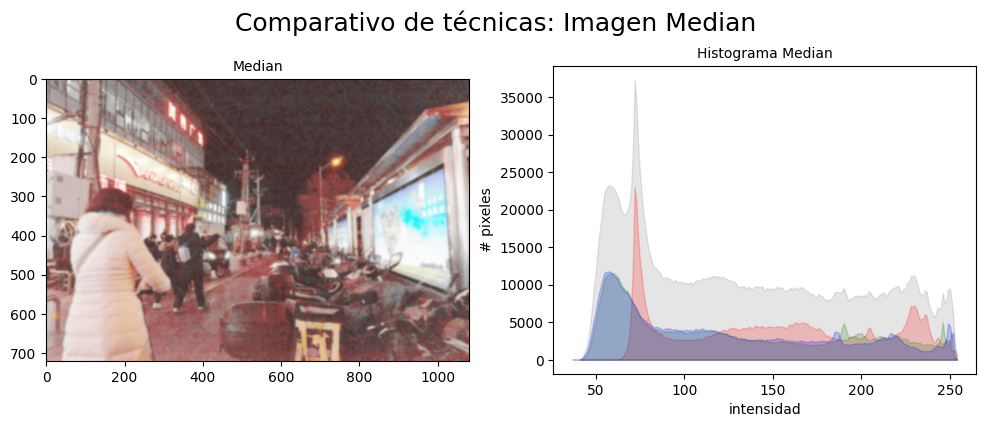

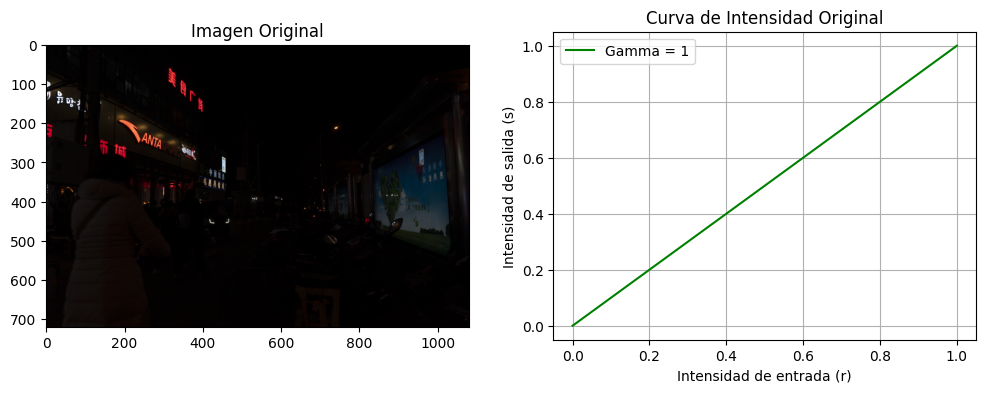

...

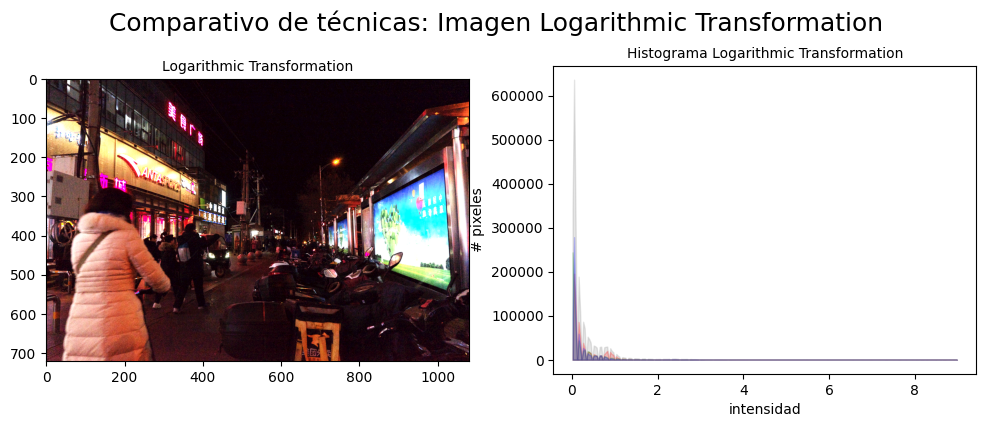

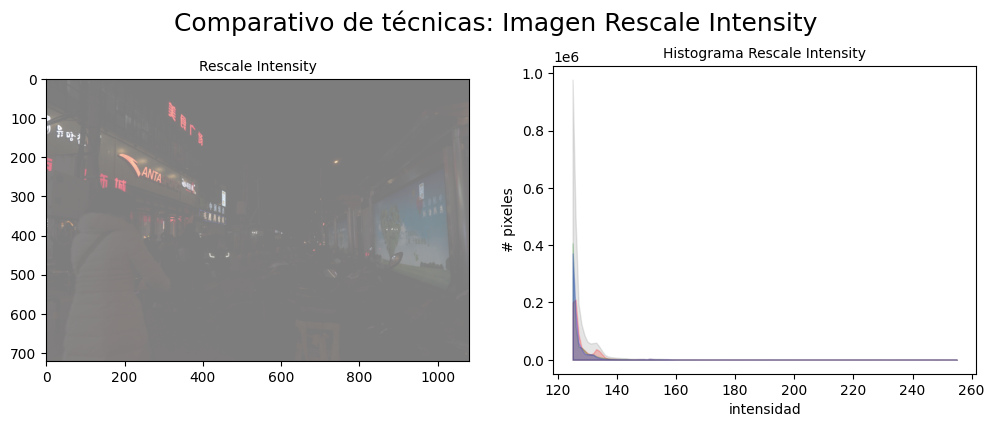

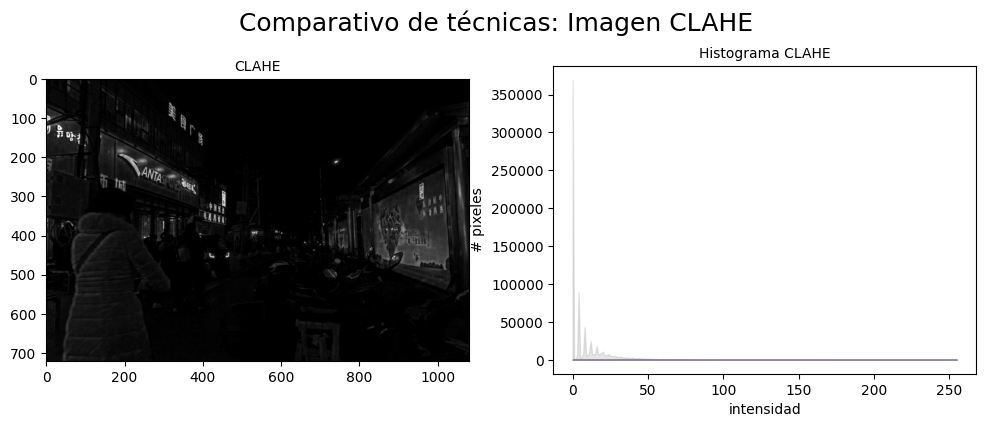

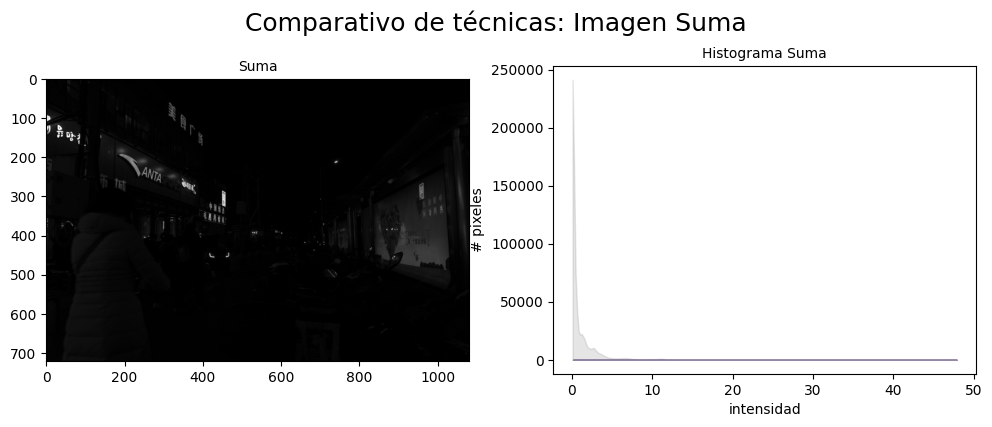

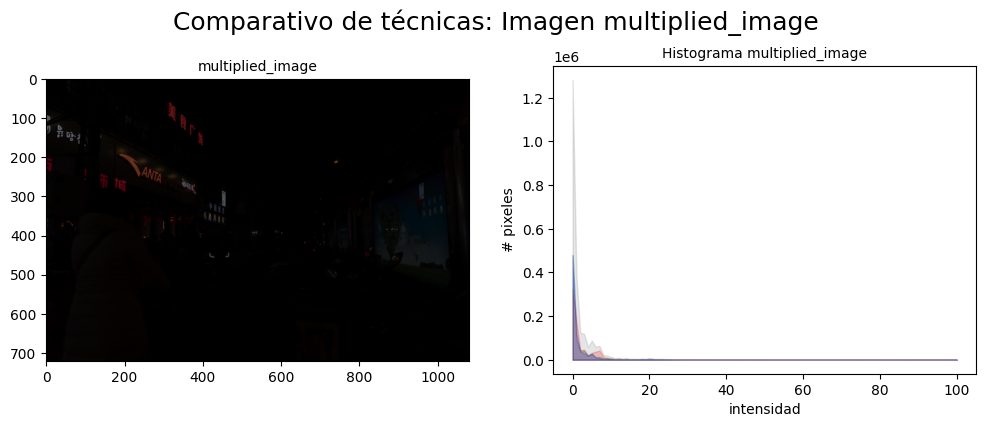

In [35]:
# Cuarta imagen
ruta_img = "Imagenes/1005.png"
imagen = imread(ruta_img)
graficar_imagen(imagen, "Original")
eq = equalizacion_histograma(imagen)
gau = noise_reduction_gaussian(eq,sigma=2)
noise_reduction_median(gau) #se puede cambiar el tamaño del kernel
#Gamma
correccion_gamma(ruta_img)
#Transformacion logaritmica
transformacion_logaritmica(ruta_img,9)
#Rescale intensity
sk_rescale_intensity(imagen, in_range='image', out_range=(125, 255))
#CLAHE
apply_clahe_skimage(imagen, clip_limit=0.01, kernel_size=(8,8))
#Aritmetic operations
apply_aritmetic_operations(imagen, scalar=100)